In [1]:
# %%
import numpy as np
import scvelo as scv
import torch
from umap import UMAP
from sklearn.decomposition import PCA
from scipy.stats import mannwhitneyu

from deepvelo.utils import (
    velocity,
    velocity_confidence,
    continuity_confidence,
    update_dict,
    cross_boundary_correctness,
)
from deepvelo.utils.scatter import scatter
from deepvelo.utils.preprocess import autoset_coeff_s
from deepvelo.utils.plot import statplot, compare_plot
from deepvelo import train, Constants


# fix random seeds for reproducibility
SEED = 123
torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(SEED)

scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.set_figure_params(
    "scvelo", transparent=False
)  # for beautified visualization


Using backend: pytorch


# Load DG data and preprocess

In [2]:
adata = scv.datasets.dentategyrus()
print(f"expression value stats, mean {adata.X.mean()}, max {adata.X.max()}")
print(f"spliced value stats, mean {adata.layers['spliced'].mean()}, max {adata.layers['spliced'].max()}")

scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_neighbors=30, n_pcs=30)
print(f"processed expression, mean {adata.X.mean()}, max {adata.X.max()}")
print(f"processed spliced stats, mean {adata.layers['spliced'].mean()}, max {adata.layers['spliced'].max()}")
print(f"Ms stats, mean {adata.layers['Ms'].mean()}, max {adata.layers['Ms'].max()}")

expression value stats, mean 0.2069723904132843, max 1718.0
spliced value stats, mean 0.2069723904132843, max 1718.0
Filtered out 10340 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
processed expression, mean 0.18905769288539886, max 6.431153297424316
processed spliced stats, mean 0.4152412414550781, max 619.8895263671875
Ms stats, mean 0.41447994112968445, max 274.1416320800781


# DeepVelo

In [3]:
# specific configs to overide the default configs
configs = {
    "name": "DeepVelo", # name of the experiment
    "loss": {"args": {"coeff_s": autoset_coeff_s(adata)}},
    "trainer": {"verbosity": 0}, # increase verbosity to show training progress
}
configs = update_dict(Constants.default_configs, configs)

The ratio of spliced reads is 89.5% (more than 85%). Suggest using coeff_s 1.0.


In [4]:
# initial velocity
velocity(adata, mask_zero=False)
trainer = train(adata, configs)


computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
building graph


INFO:train:Beginning training of DeepVelo ...


velo data shape: torch.Size([2930, 2000])


confidence mse shape: (2930, 2000)
confidence mse stats: max 3070.997314453125, min 0.0, mean 0.18278032541275024, std 5.528724670410156
confidence corr shape: (2000,)
confidence corr stats: max 0.9642184972763062, min -0.5345625877380371, mean 0.5343204140663147, std 0.1724088191986084
velo_mat shape: (2930, 2000)
--> added 'velocity' (adata.layers)
--> added 'velocity_unspliced' (adata.layers)
--> added 'cell_specific_beta' (adata.layers)
--> added 'cell_specific_gamma' (adata.layers)


In [5]:
scv.tl.velocity_graph(adata, n_jobs=8)

computing velocity graph (using 8/8 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:11) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


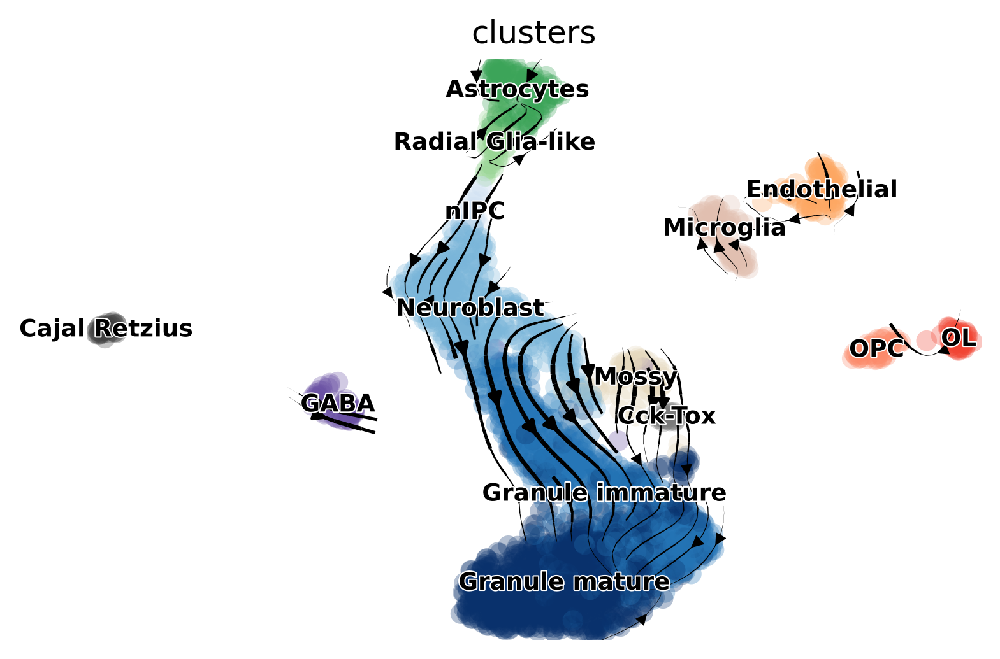

In [6]:
# velocity plot
scv.pl.velocity_embedding_stream(
    adata,
    basis="umap",
    color="clusters",
    legend_fontsize=9,
    dpi=150            # increase dpi for higher resolution
)


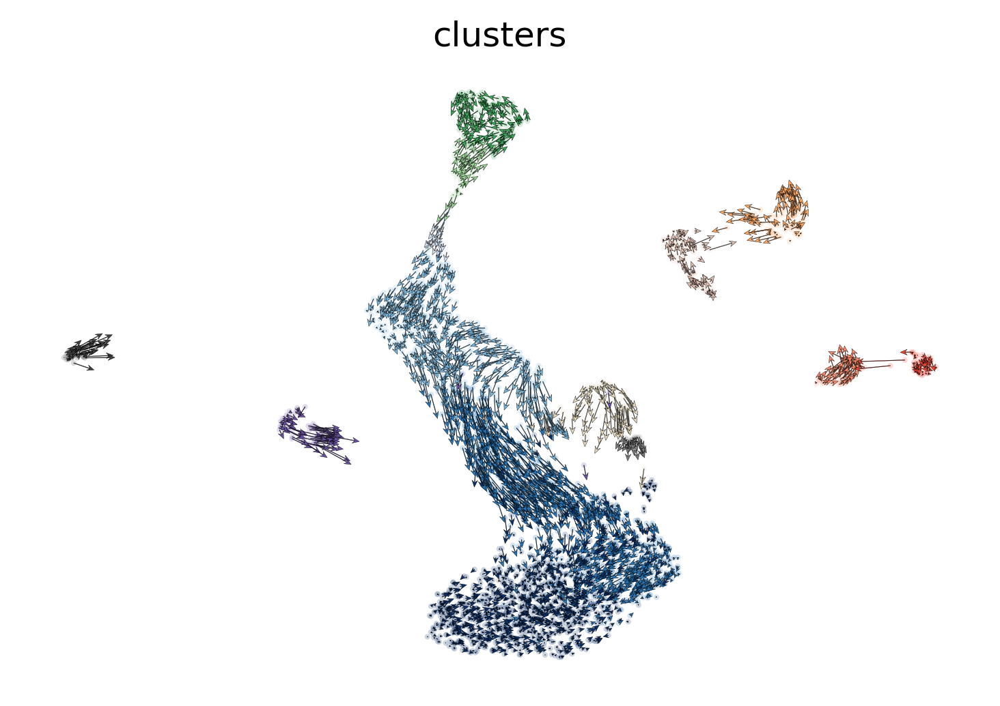

In [7]:
scv.pl.velocity_embedding(
    adata,
    basis="umap",
    arrow_length=6,
    arrow_size=1.2,
    dpi=150,
)


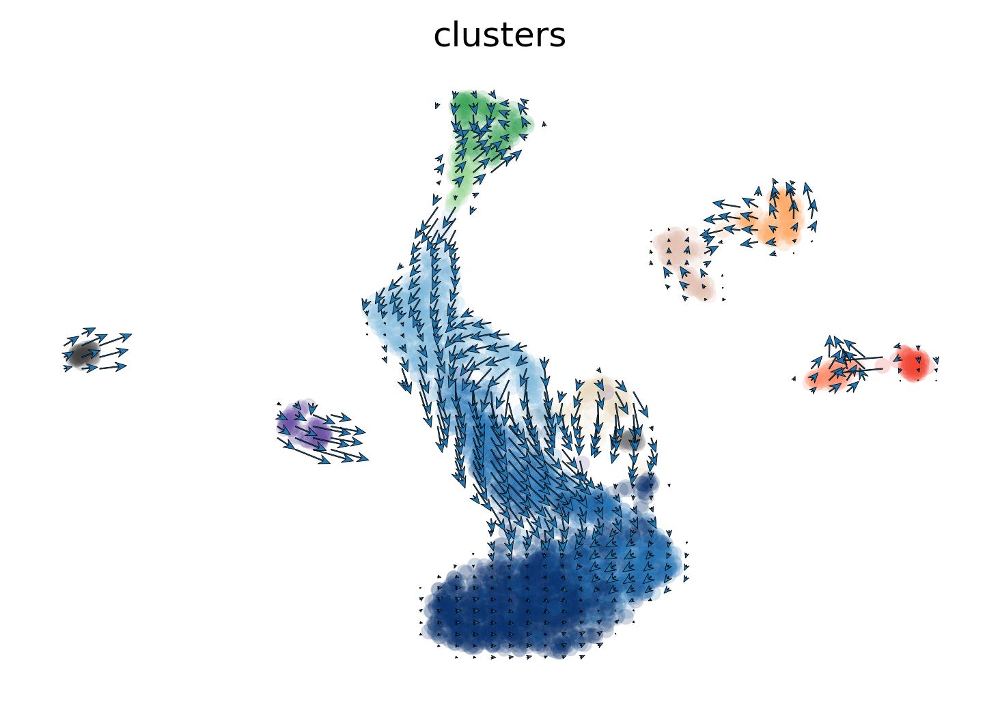

In [8]:
scv.pl.velocity_embedding_grid(
    adata,
    basis="umap",
    arrow_length=4,
    # alpha=0.1,
    arrow_size=2,
    arrow_color="tab:blue",
    dpi=150,
)


In [9]:
continuity_confidence(adata, trainer)


added 'continuity_mse' (adata.layers)
added 'continuity_relative_error' (adata.layers)
added 'cell_continuity' (adata.obs)
added 'gene_continuity' (adata.var)
added 'gene_corr' (adata.var)


Text(0.5, 0, 'log1p gene continuity mse')

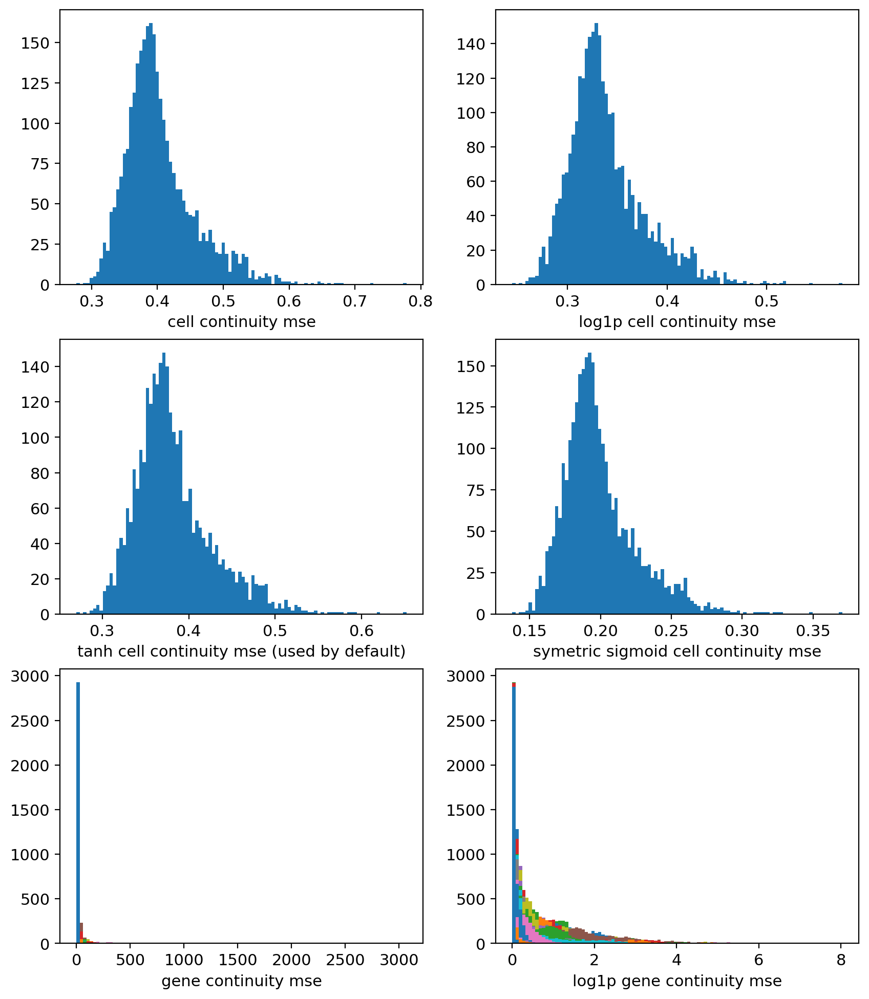

In [10]:
# show histogram of cell continuity
cell_continuity_mse = adata.layers["continuity_relative_error"].mean(axis=1) / (
        adata.layers["Ms"].mean(axis=1) + 1e-6
    )
from matplotlib import pyplot as plt
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 12))
axes[0,0].hist(cell_continuity_mse, bins=100, histtype="stepfilled")
axes[0,0].set_xlabel("cell continuity mse")
axes[0,1].hist(np.log(1+cell_continuity_mse), bins=100, histtype="stepfilled")
axes[0,1].set_xlabel("log1p cell continuity mse")
axes[1,0].hist(np.tanh(cell_continuity_mse), bins=100, histtype="stepfilled")
axes[1,0].set_xlabel("tanh cell continuity mse (used by default)")
axes[1,1].hist(2/(1+np.exp(-cell_continuity_mse)) - 1, bins=100, histtype="stepfilled")
axes[1,1].set_xlabel("symetric sigmoid cell continuity mse")
axes[2,0].hist(trainer.confidence["mse"], bins=100, histtype="stepfilled")
axes[2,0].set_xlabel("gene continuity mse")
axes[2,1].hist(np.log(1+trainer.confidence["mse"]), bins=100, histtype="stepfilled")
axes[2,1].set_xlabel("log1p gene continuity mse")


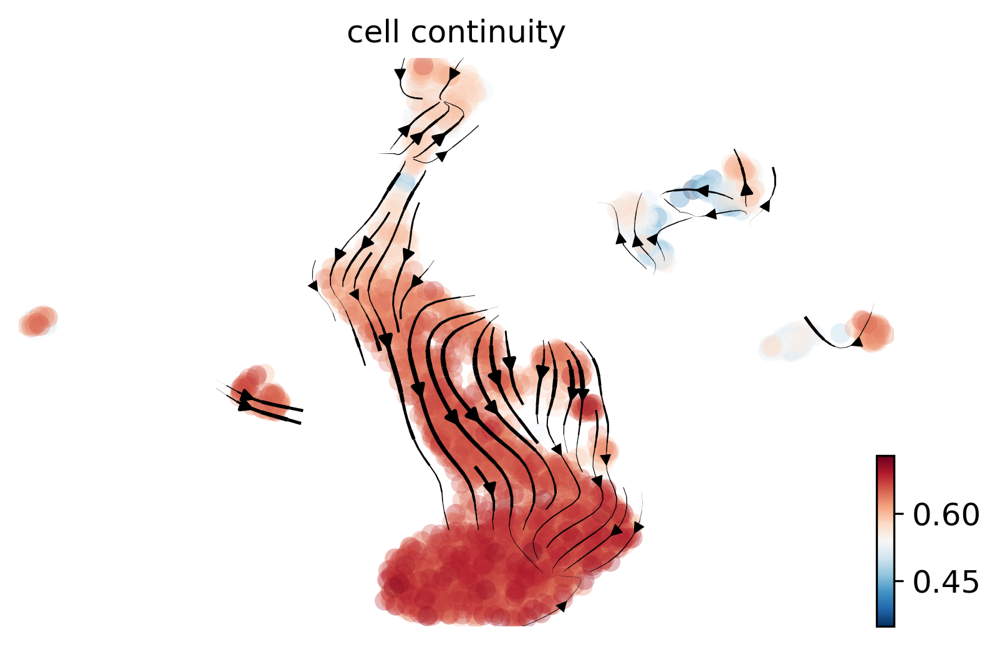

In [11]:
# velocity plot
scv.pl.velocity_embedding_stream(
    adata,
    basis="umap",
    color="cell_continuity",
    # color_map="heat",
    legend_fontsize=6,
    # perc=[2, 98],
    dpi=150            # increase dpi for higher resolution
)

In [12]:
# get kinetic_rates
if "cell_specific_alpha" in adata.layers:
    all_rates = np.concatenate(
        [
            adata.layers["cell_specific_beta"],
            adata.layers["cell_specific_gamma"],
            adata.layers["cell_specific_alpha"],
        ],
        axis=1,
    )
    gene_wise_rates = np.concatenate(
        [
            adata.layers["cell_specific_beta"],
            adata.layers["cell_specific_gamma"],
            adata.layers["cell_specific_alpha"],
        ],
        axis=0,
    ).T
else:
    all_rates = np.concatenate(
        [
            adata.layers["cell_specific_beta"],
            adata.layers["cell_specific_gamma"],
        ],
        axis=1,
    )
    gene_wise_rates = np.concatenate(
        [
            adata.layers["cell_specific_beta"],
            adata.layers["cell_specific_gamma"],
        ],
        axis=0,
    ).T

# pca and umap of all rates
rates_pca = PCA(n_components=30, random_state=SEED).fit_transform(all_rates)
adata.obsm["X_rates_pca"] = rates_pca

rates_umap = UMAP(
    n_neighbors=60,
    min_dist=0.6,
    spread=0.9,
    random_state=SEED,
).fit_transform(rates_pca)
adata.obsm["X_rates_umap"] = rates_umap

# pca and umap of gene-wise rates
rates_pca_gene_wise = PCA(n_components=30, random_state=SEED).fit_transform(
    adata.layers["Ms"].T
)
adata.varm["rates_pca"] = rates_pca_gene_wise

rates_umap_gene_wise = UMAP(
    n_neighbors=60,
    min_dist=0.6,
    spread=0.9,
    random_state=SEED,
).fit_transform(rates_pca_gene_wise)
adata.varm["rates_umap"] = rates_umap_gene_wise


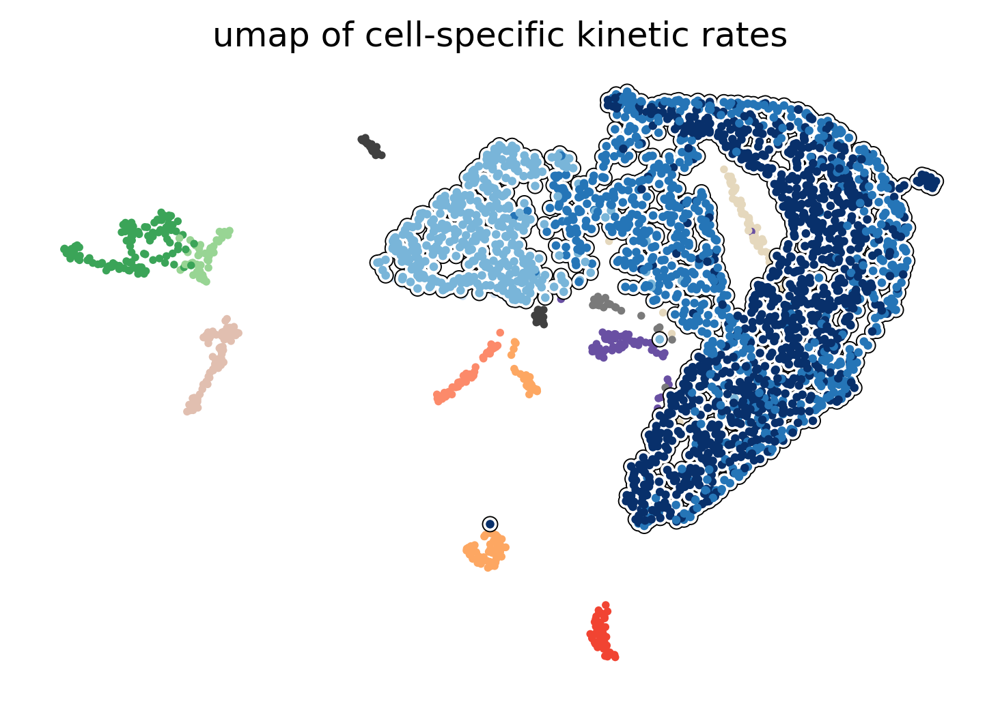

In [13]:
# plot kinetic rates umap
scv.pl.scatter(
    adata,
    basis="rates_umap",
    # omit_velocity_fit=True,
    add_outline="Granule mature, Granule immature, Neuroblast",
    outline_width=(0.15, 0.3),
    title="umap of cell-specific kinetic rates",
    legend_loc="none",
    dpi=150,
)

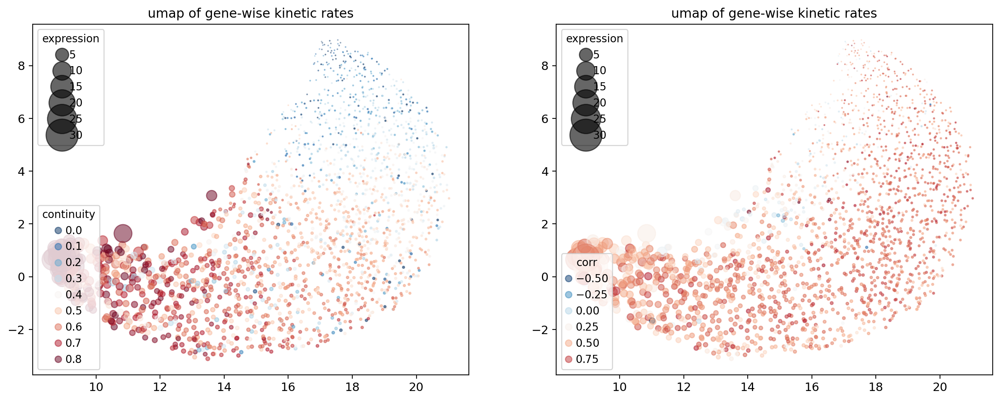

In [14]:
# plot rates_umap_gene_wise
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
visual_size = 30
scatter_plot = axes[0].scatter(
    rates_umap_gene_wise[:, 0],
    rates_umap_gene_wise[:, 1],
    c=adata.var["gene_continuity"],
    s=(adata.layers["Ms"].mean(axis=0) * visual_size).tolist(),
    alpha=0.5,
)
# color bar lim to 2%, 98% of continuity
continuity_lim = np.percentile(adata.var["gene_continuity"], [2, 98])
scatter_plot.set_clim(continuity_lim)
axes[0].set_title("umap of gene-wise kinetic rates")
axes[0].add_artist(
    axes[0].legend(
        *scatter_plot.legend_elements(),
        loc="lower left",
        title="continuity",
        title_fontsize="small",
        fontsize="small",
    )
)
axes[0].legend(
    *scatter_plot.legend_elements(prop="sizes", alpha=0.6, func=lambda s: s / visual_size, num=7),
    loc="best",
    title="expression",
    title_fontsize="small",
    fontsize="small",
)
scatter_plot = axes[1].scatter(
    rates_umap_gene_wise[:, 0],
    rates_umap_gene_wise[:, 1],
    c=adata.var["gene_corr"],
    s=(adata.layers["Ms"].mean(axis=0) * visual_size).tolist(),
    alpha=0.5,
)
axes[1].set_title("umap of gene-wise kinetic rates")
axes[1].add_artist(
    axes[1].legend(
        *scatter_plot.legend_elements(num=7),
        loc="lower left",
        title="corr",
        title_fontsize="small",
        fontsize="small",
    )
)
axes[1].legend(
    *scatter_plot.legend_elements(prop="sizes", alpha=0.6, func=lambda s: s / visual_size, num=7),
    loc="best",
    title="expression",
    title_fontsize="small",
    fontsize="small",
)


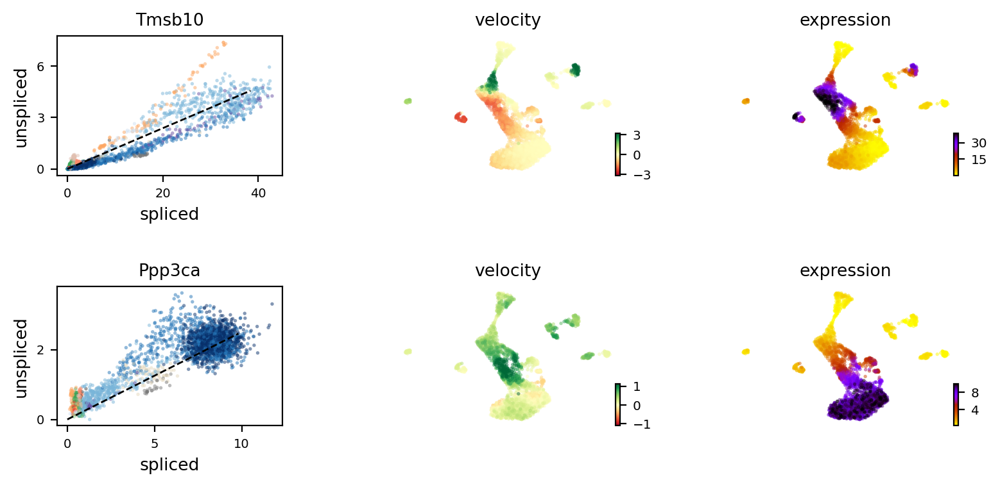

        gene_corr  gene_continuity
index                             
Tmsb10   0.152034         0.820165
Ppp3ca   0.146753         0.870729


<Figure size 600x400 with 0 Axes>

In [15]:
# plot genes
scv.pl.velocity(
    adata,
    var_names=["Tmsb10", "Ppp3ca"],
    basis="umap",
)
plt.tight_layout()
print(adata.var.loc[["Tmsb10", "Ppp3ca"], ["gene_corr", "gene_continuity"]])

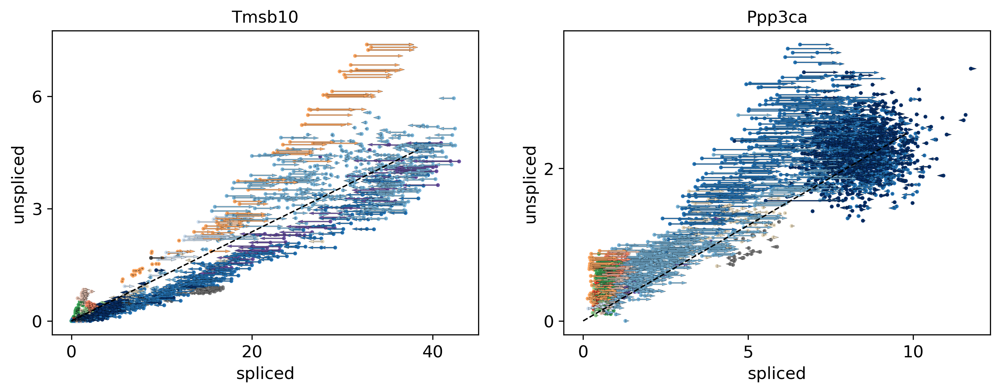

In [16]:
if "velocity_unspliced" not in adata.layers:
    adata.layers["velocity_unspliced"] = np.zeros_like(adata.layers["velocity"])
scatter(
    adata,
    basis=["Tmsb10", "Ppp3ca"],
    add_quiver=True,
    dpi=150,
    legend_loc_lines="none",
)

# can have a figure showing the difference distribution of velocity vector length 
# and directions across celltypes, to show that we do have very clear power to 
# learn cell-specific patterns clearly distinguishing celltypes


In [17]:
adata.var["gene_corr"].describe()

count    2000.000000
mean        0.534320
std         0.172452
min        -0.534563
25%         0.443770
50%         0.573027
75%         0.655966
max         0.964218
Name: gene_corr, dtype: float64

In [18]:
adata.var["gene_continuity"].describe()

count    2000.000000
mean        0.444255
std         0.190292
min         0.000000
25%         0.322067
50%         0.464680
75%         0.580634
max         0.897905
Name: gene_continuity, dtype: float64

Text(0.5, 0.98, 'least ranked genes by gene_corr')

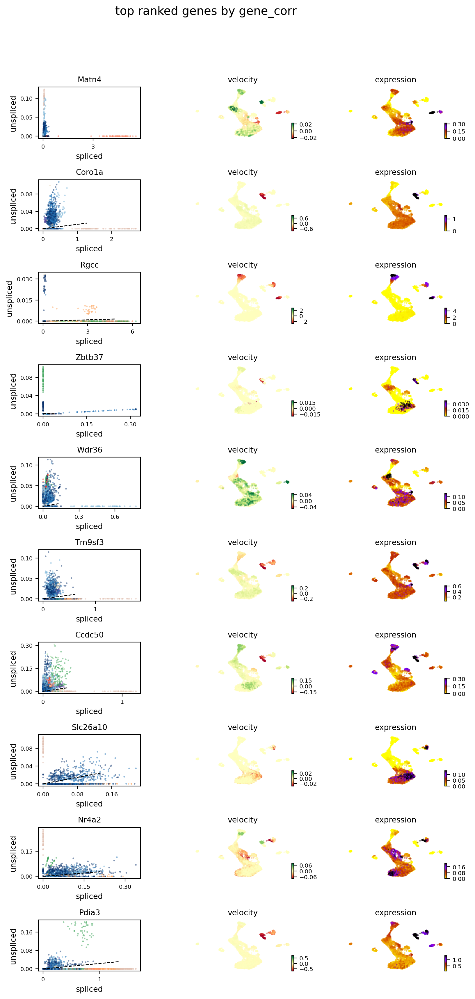

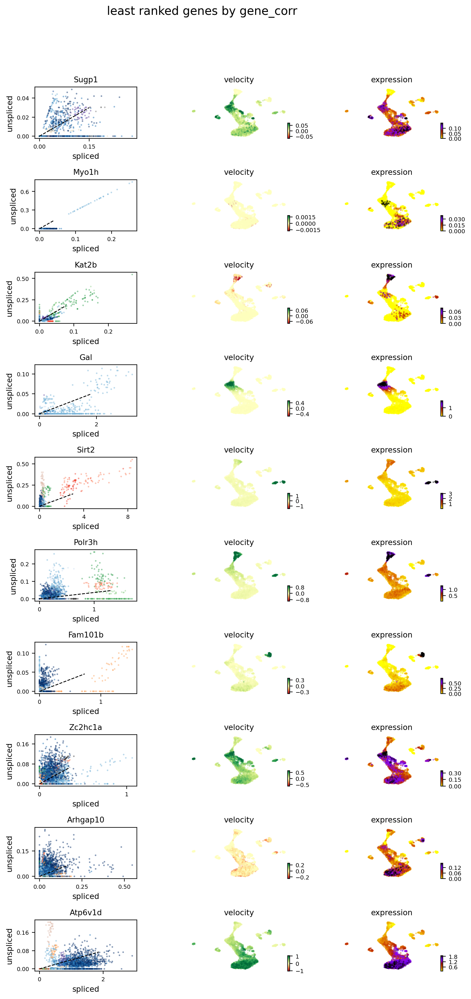

In [19]:
num_show_genes = 10
top_ranked_genes_corr = adata.var.sort_values("gene_corr", ascending=False).index[:num_show_genes]
least_ranked_genes_corr = adata.var.sort_values("gene_corr", ascending=False).index[-num_show_genes:]

ax = scv.pl.velocity(
    adata,
    var_names=top_ranked_genes_corr,
    basis="umap",
    show=False,
)
ax.get_figure().suptitle("top ranked genes by gene_corr")

ax = scv.pl.velocity(
    adata,
    var_names=least_ranked_genes_corr,
    basis="umap",
    show=False,
)
ax.get_figure().suptitle("least ranked genes by gene_corr")


Text(0.5, 0.98, 'least ranked genes by gene_continuity')

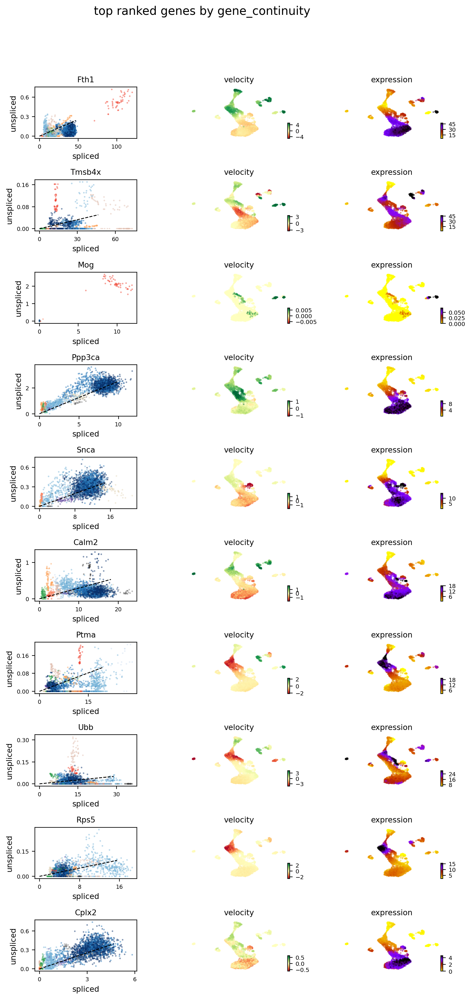

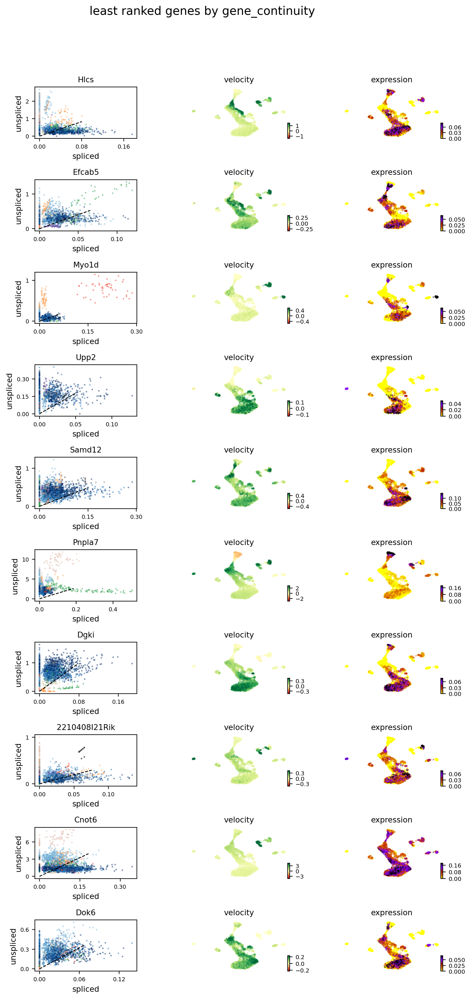

In [20]:
top_ranked_genes_continuity = adata.var.sort_values("gene_continuity", ascending=False).index[:num_show_genes]
least_ranked_genes_continuity = adata.var.sort_values("gene_continuity", ascending=False).index[-num_show_genes:]

ax = scv.pl.velocity(
    adata,
    var_names=top_ranked_genes_continuity,
    basis="umap",
    show=False,
)
ax.get_figure().suptitle("top ranked genes by gene_continuity")
# NOTE: we have Ppp3ca listed here nicely
# And nicely it is explainable in the way, in most of the top ranked ones, the 
# clear difference of spliced gene expression horisontally can be observed 
# among the large portion of neuralblasts to granule immature and mature cells.

ax = scv.pl.velocity(
    adata,
    var_names=least_ranked_genes_continuity,
    basis="umap",
    show=False,
)
ax.get_figure().suptitle("least ranked genes by gene_continuity")

computing terminal states
    identified 6 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


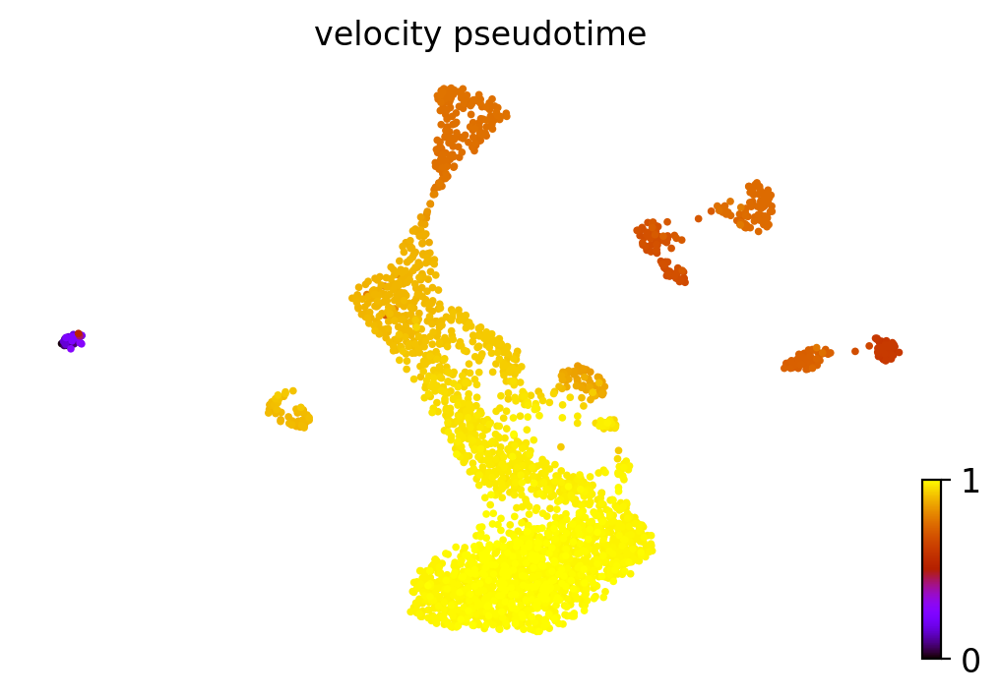

In [21]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', color_map='gnuplot')

In [22]:
adata

AnnData object with n_obs × n_vars = 2930 × 2000
    obs: 'clusters', 'age(days)', 'clusters_enlarged', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'cell_continuity', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'gene_continuity', 'gene_corr'
    uns: 'clusters_colors', 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_umap', 'X_pca', 'velocity_umap', 'X_rates_pca', 'X_rates_umap'
    varm: 'PCs', 'rates_pca', 'rates_umap'
    layers: 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity', 'cell_specific_beta', 'cell_specific_gamma', 'continuity_mse', 'continuity_relative_error', 'velocity_unspliced'
    obsp: 'distances', 'connectivities'

In [24]:
# driver genes
from scipy.stats import pearsonr

time_corr = []
time_corr_pval = []
for gene in adata.var_names:
    tcorr, pval = pearsonr(adata.obs["velocity_pseudotime"], adata[:, gene].layers["Ms"].mean(axis=1))
    time_corr.append(tcorr)
    time_corr_pval.append(pval)

adata.var["time_corr"] = time_corr
adata.var["time_corr_abs"] = np.abs(time_corr)
adata.var["time_corr_pval"] = time_corr_pval

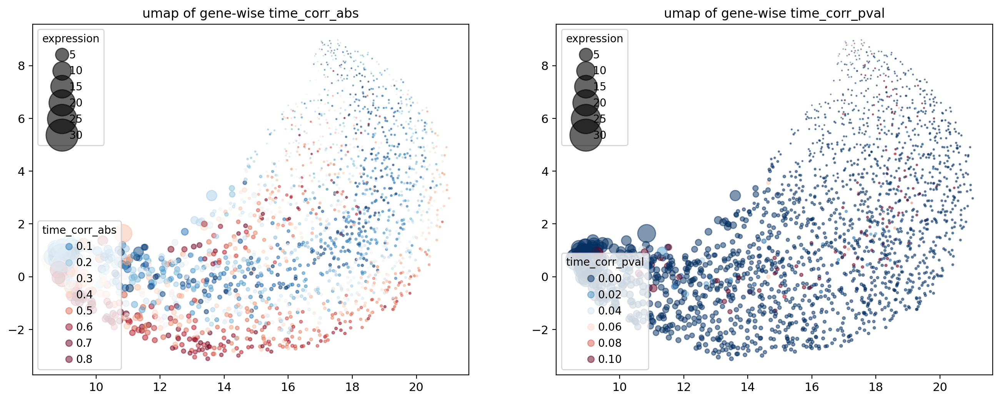

In [31]:
# plot rates_umap_gene_wise
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
visual_size = 30
scatter_plot = axes[0].scatter(
    rates_umap_gene_wise[:, 0],
    rates_umap_gene_wise[:, 1],
    c=adata.var["time_corr_abs"],
    s=(adata.layers["Ms"].mean(axis=0) * visual_size).tolist(),
    alpha=0.5,
)
# color bar lim to 2%, 98% of continuity
continuity_lim = np.percentile(adata.var["time_corr_abs"], [2, 98])
scatter_plot.set_clim(continuity_lim)
axes[0].set_title("umap of gene-wise time_corr_abs")
axes[0].add_artist(
    axes[0].legend(
        *scatter_plot.legend_elements(),
        loc="lower left",
        title="time_corr_abs",
        title_fontsize="small",
        fontsize="small",
    )
)
axes[0].legend(
    *scatter_plot.legend_elements(prop="sizes", alpha=0.6, func=lambda s: s / visual_size, num=7),
    loc="best",
    title="expression",
    title_fontsize="small",
    fontsize="small",
)
scatter_plot = axes[1].scatter(
    rates_umap_gene_wise[:, 0],
    rates_umap_gene_wise[:, 1],
    c=np.clip(adata.var["time_corr_pval"], 0, 0.1),
    s=(adata.layers["Ms"].mean(axis=0) * visual_size).tolist(),
    alpha=0.5,
)
axes[1].set_title("umap of gene-wise time_corr_pval")
axes[1].add_artist(
    axes[1].legend(
        *scatter_plot.legend_elements(num=7),
        loc="lower left",
        title="time_corr_pval",
        title_fontsize="small",
        fontsize="small",
    )
)
axes[1].legend(
    *scatter_plot.legend_elements(prop="sizes", alpha=0.6, func=lambda s: s / visual_size, num=7),
    loc="best",
    title="expression",
    title_fontsize="small",
    fontsize="small",
)

,time_corr,time_corr_abs,time_corr_pval
index,,,
Fnta,-0.829777,0.829777,0.0
Gclm,-0.757122,0.757122,0.0
Gkap1,-0.756440,0.756440,0.0
Ubc,-0.745671,0.745671,0.0
Tmem163,-0.734568,0.734568,0.0
Ppp3ca,0.728406,0.728406,0.0
Smad1,-0.720957,0.720957,0.0
Snca,0.717378,0.717378,0.0
Selk,-0.711265,0.711265,0.0


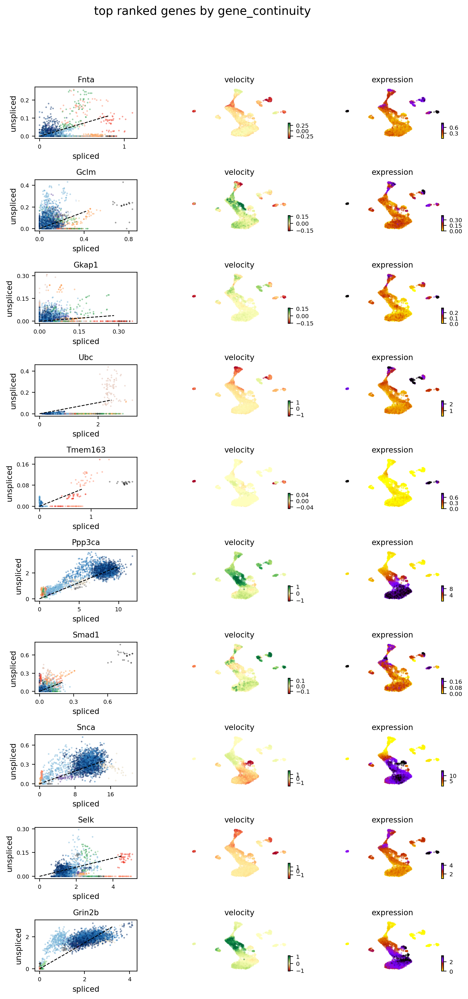

In [33]:
top_ranked_genes_continuity = adata.var.sort_values("time_corr_abs", ascending=False).index[:num_show_genes]
least_ranked_genes_continuity = adata.var.sort_values("time_corr_abs", ascending=False).index[-num_show_genes:]

ax = scv.pl.velocity(
    adata,
    var_names=top_ranked_genes_continuity,
    basis="umap",
    show=False,
)
ax.get_figure().suptitle("top ranked genes by gene_continuity")

adata.var.loc[top_ranked_genes_continuity, ["time_corr", "time_corr_abs", "time_corr_pval"]]

In [ ]:
# pick lineages by selecting celltypes or louvain clusters on velocity graph

In [21]:
# save adata for next steps
deepvelo_adata = adata.copy()

# scVelo (dynamical)

In [13]:
adata = scv.datasets.dentategyrus()
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_neighbors=30, n_pcs=30)

Filtered out 10340 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [14]:
scv.tl.recover_dynamics(adata, n_jobs=8)
scv.tl.velocity(adata, mode="dynamical")


recovering dynamics (using 8/8 cores)


  0%|          | 0/975 [00:00<?, ?gene/s]

    finished (0:01:10) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [15]:
scv.tl.velocity_graph(adata, n_jobs=8)


computing velocity graph (using 8/8 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


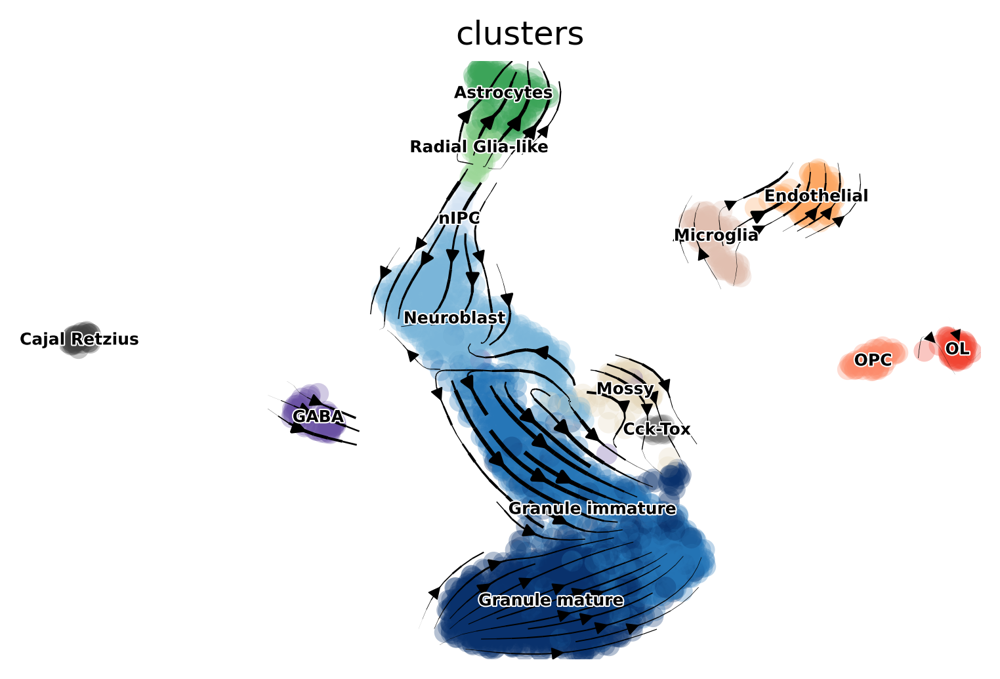

In [16]:
# velocity plot
scv.pl.velocity_embedding_stream(
    adata,
    basis="umap",
    color="clusters",
    legend_fontsize=6,
    dpi=150            # increase dpi for higher resolution
)

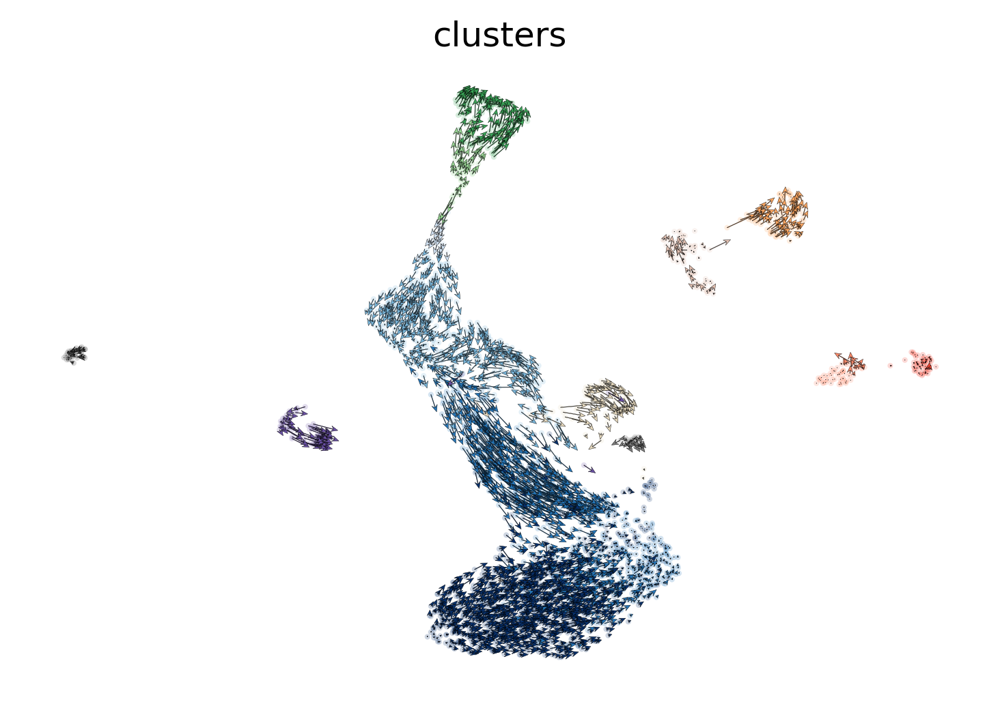

In [17]:
scv.pl.velocity_embedding(
    adata,
    basis="umap",
    arrow_length=6,
    arrow_size=1.2,
    dpi=150,
)

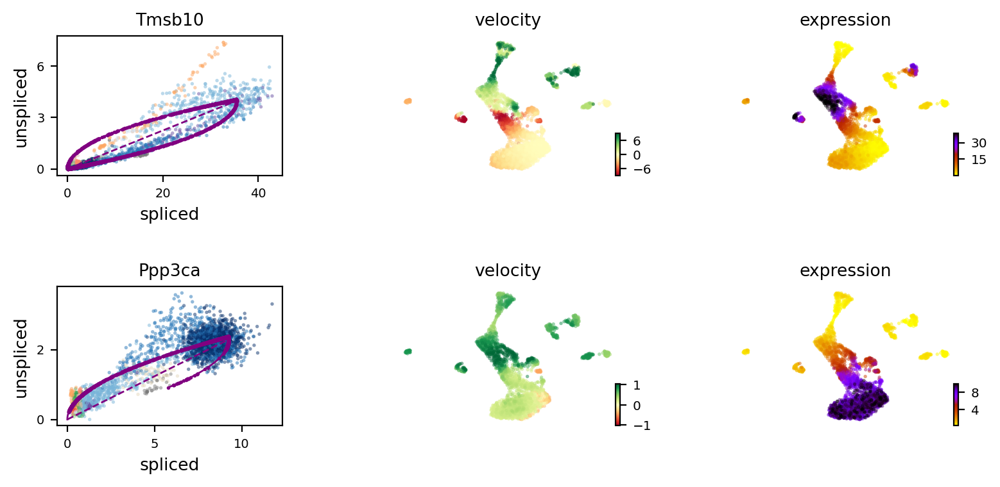

In [18]:
# plot genes
scv.pl.velocity(
    adata,
    var_names=["Tmsb10", "Ppp3ca"],
    basis="umap",
)

computing terminal states
    identified 5 regions of root cells and 3 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


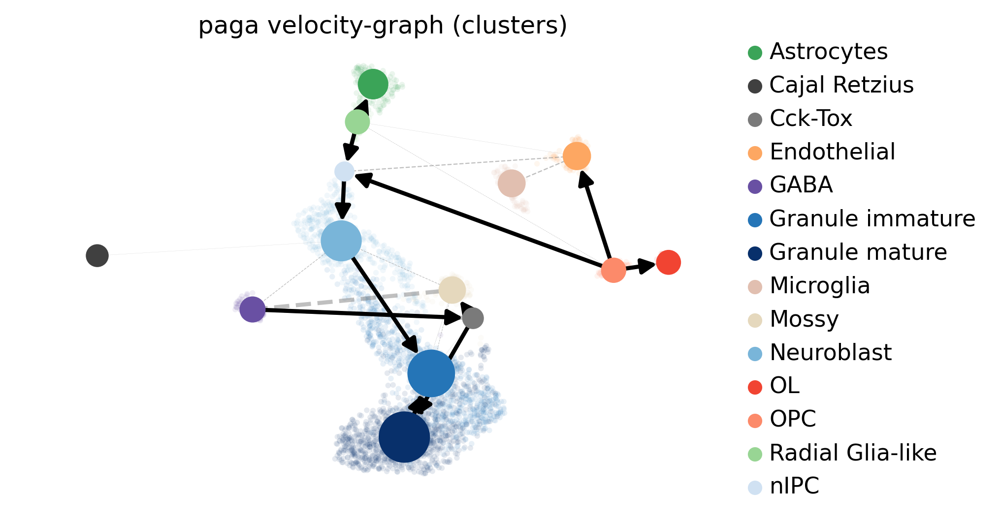

In [19]:
# trajectory inference
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']
scv.tl.paga(adata, groups="clusters")
scv.pl.paga(
    adata,
    basis="umap",
    size=30,
    alpha=0.1,
    min_edge_width=2,
    node_size_scale=1,
    dpi=150,
)

In [20]:
# save adata for next steps
dynamical_adata = adata.copy()

# Compare direction scores

In [21]:
cluster_edges = [
    ("Mossy", "Cck-Tox"),
    ("Radial Glia-like", "Astrocytes"),
    ("nIPC", "Neuroblast"),
    ("Neuroblast", "Granule immature"),
    ("Granule immature", "Granule mature"),
]
cbcs, avg_cbc = cross_boundary_correctness(
    deepvelo_adata, "clusters", "velocity", cluster_edges, return_raw=False, x_emb="X_umap"
)
print(f"Average cross-boundary correctness of DeepVelo: {avg_cbc:.2f}")
cbcs

Average cross-boundary correctness of DeepVelo: 0.56


{('Mossy', 'Cck-Tox'): 0.3809359716190217,
 ('Radial Glia-like', 'Astrocytes'): 0.6556221855085942,
 ('nIPC', 'Neuroblast'): 0.9097811756995552,
 ('Neuroblast', 'Granule immature'): 0.5242351474961235,
 ('Granule immature', 'Granule mature'): 0.31155085786633435}

In [22]:
cbcs, avg_cbc = cross_boundary_correctness(
    dynamical_adata, "clusters", "velocity", cluster_edges, return_raw=False, x_emb="X_umap"
)
print(f"Average cross-boundary correctness of Dynamical: {avg_cbc:.2f}")
cbcs

Average cross-boundary correctness of Dynamical: 0.40


{('Mossy', 'Cck-Tox'): 0.4728940061448451,
 ('Radial Glia-like', 'Astrocytes'): 0.8347780120720804,
 ('nIPC', 'Neuroblast'): 0.9060504558755296,
 ('Neuroblast', 'Granule immature'): -0.02675113730002718,
 ('Granule immature', 'Granule mature'): -0.1912958285958494}

# Compare consistency score

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence_cosine' (adata.obs)
--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence_cosine' (adata.obs)
DeepVelo mean score: 0.9482, std: 0.0319
Dynamical mean score: 0.8009, std: 0.1074


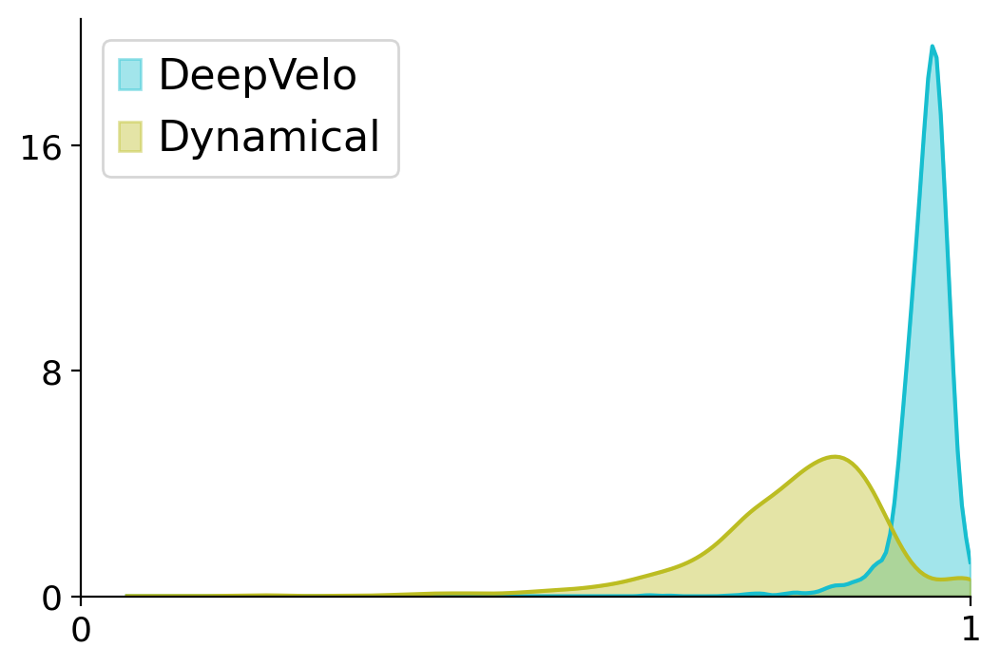

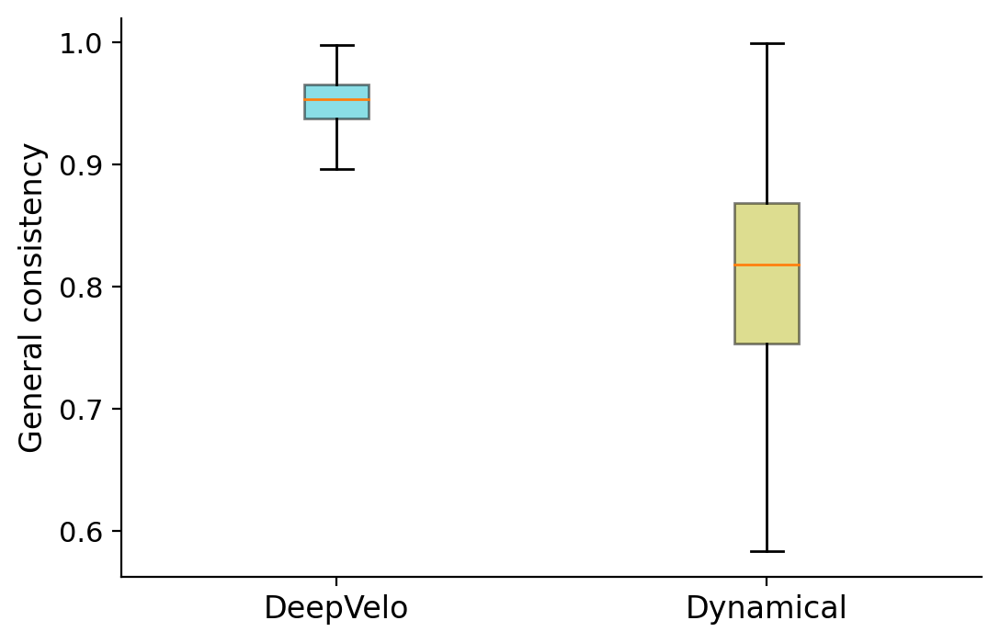

In [23]:
vkey = "velocity"
method = "cosine"
velocity_confidence(deepvelo_adata, vkey=vkey, method=method)
velocity_confidence(dynamical_adata, vkey=vkey, method=method)
compare_plot(deepvelo_adata, dynamical_adata, method=method)

In [24]:
# Mann-Whitney U Test test
stat, p = mannwhitneyu(
    deepvelo_adata.obs["velocity_confidence_cosine"].tolist(),
    dynamical_adata.obs["velocity_confidence_cosine"].tolist(),
)
print(f"Statistics={stat:.3f}, {p}")
# interpret
alpha = 0.05
if p > alpha:
    print("Same distribution (fail to reject H0)")
else:
    print("Different distribution (reject H0)")


Statistics=476108.000, 0.0
Different distribution (reject H0)


--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence_cosine' (adata.obs)
--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence_cosine' (adata.obs)
DeepVelo mean score: 0.8440, std: 0.0818
Dynamical mean score: 0.6077, std: 0.1430


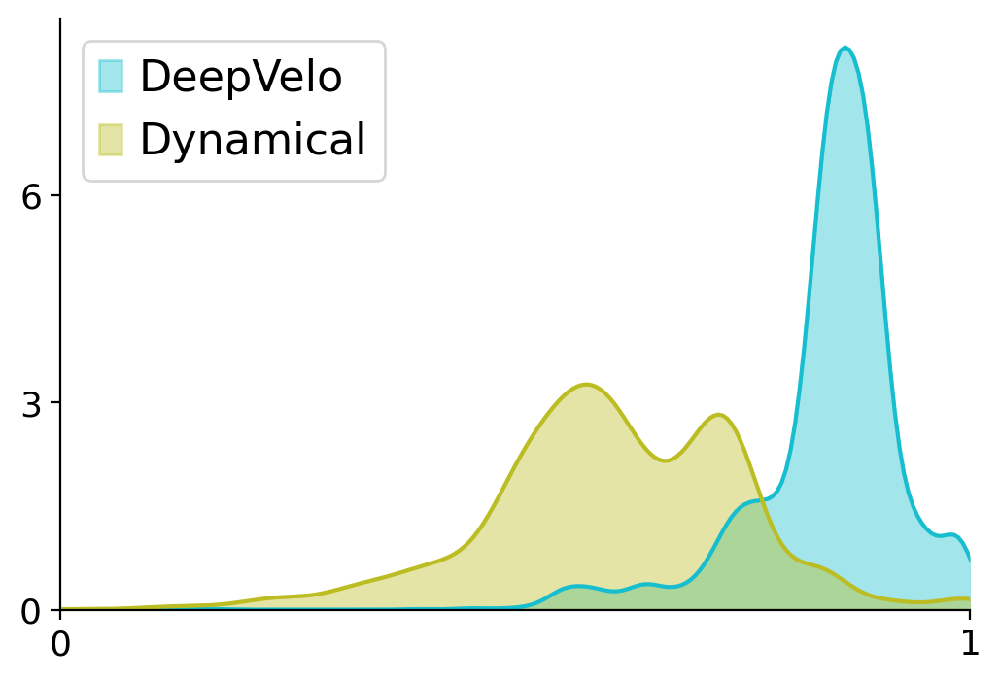

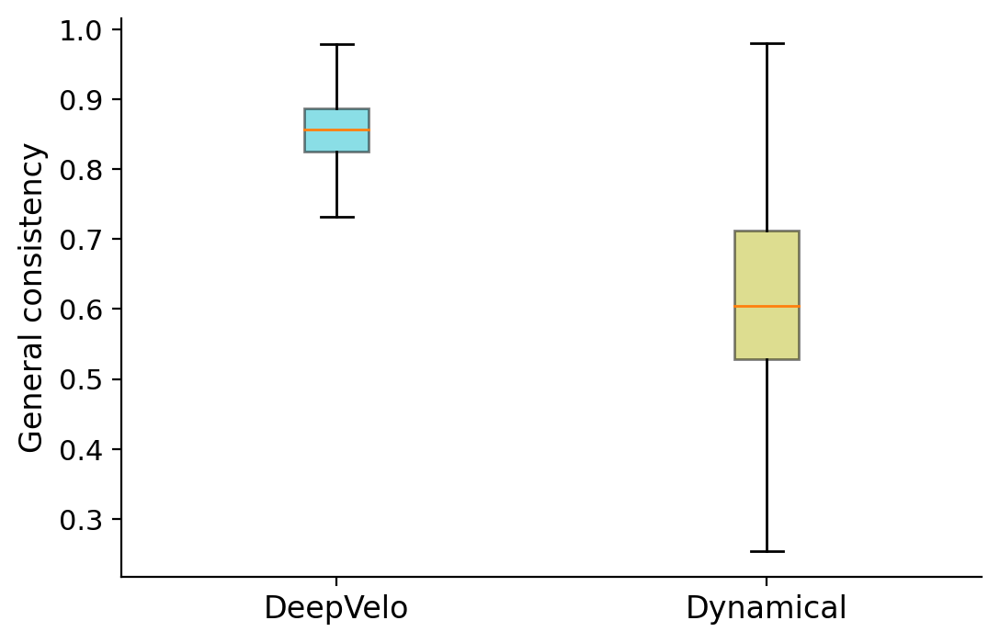

In [25]:
vkey = "velocity"
method = "cosine"
scope_key = "clusters"
# 3. cosine similarity, compute within Celltype
velocity_confidence(deepvelo_adata, vkey=vkey, method=method, scope_key=scope_key)
velocity_confidence(dynamical_adata, vkey=vkey, method=method, scope_key=scope_key)
compare_plot(deepvelo_adata, dynamical_adata, method=method)

In [26]:
# Mann-Whitney U Test test
stat, p = mannwhitneyu(
    deepvelo_adata.obs["velocity_confidence_cosine"].tolist(),
    dynamical_adata.obs["velocity_confidence_cosine"].tolist(),
)
print(f"Statistics={stat:.3f}, {p}")
# interpret
alpha = 0.05
if p > alpha:
    print("Same distribution (fail to reject H0)")
else:
    print("Different distribution (reject H0)")

Statistics=565243.000, 0.0
Different distribution (reject H0)
